In [1]:
import torch
import numpy as np

from zsl_utils.olmo import get_olmo_model_steps
from zsl_utils.mpl import *
from zsl_config import ZSL_DIR_ANALYSIS

In [2]:
EVAL_NAME = 'LL_xsections_true_step'
MODEL_CLASS = 'olmo'
EVAL_DIR = ZSL_DIR_ANALYSIS / EVAL_NAME / MODEL_CLASS

RUNS = [
        '1028-rmsnorm-14m',
        '1028-rmsnorm-37m',
        '1028-rmsnorm-78m',
        '1028-rmsnorm-144m',
        '1028-rmsnorm-285m',
        '1028-rmsnorm-472m',
    ]

def get_run_train_batch_steps(run: str):
    run_dir = EVAL_DIR / run 
    return sorted([int(d.stem.replace('train_batch=','')) for d in run_dir.glob("train_batch=[1-9]*")])

def get_metrics_train(run: str, step: int, train_batch_step: int):
    f = EVAL_DIR / run / f"train_batch={train_batch_step}/train/step{step}.pt"
    return torch.load(f,  weights_only=True)


def get_run_eval_batch_steps(run: str, train_batch_step: int):
    run_dir = EVAL_DIR / run / f"train_batch={train_batch_step}"
    return sorted([int(d.stem.replace('eval_batch=','')) for d in run_dir.glob("eval_batch=[1-9]*")])   

def get_metrics_eval(run: str, step: int, train_batch_step: int, eval_batch_step: int):
    f = EVAL_DIR / run / f"train_batch={train_batch_step}/eval_batch={eval_batch_step}/step{step}.pt"
    return torch.load(f,  weights_only=True)

    
# run = RUNS[0]
# step = 1024

# train_batch_steps = get_run_train_batch_steps(run)
# train_batch_step = train_batch_steps[0]

# eval_batch_steps = get_run_eval_batch_steps(run, train_batch_step)
# eval_batch_step = eval_batch_steps[0]

# metrics_train = get_metrics_train(run,step=step, train_batch_step=train_batch_step)
# metrics_eval = get_metrics_eval(run,step=step, train_batch_step=train_batch_step, eval_batch_step=eval_batch_step)

## Loss landscape cross sections

/tmp/ipykernel_2338948/2483168752.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('RdYlBu')


/home/mila/m/mirceara/1.workspace/zsl/.venv/lib/python3.10/site-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


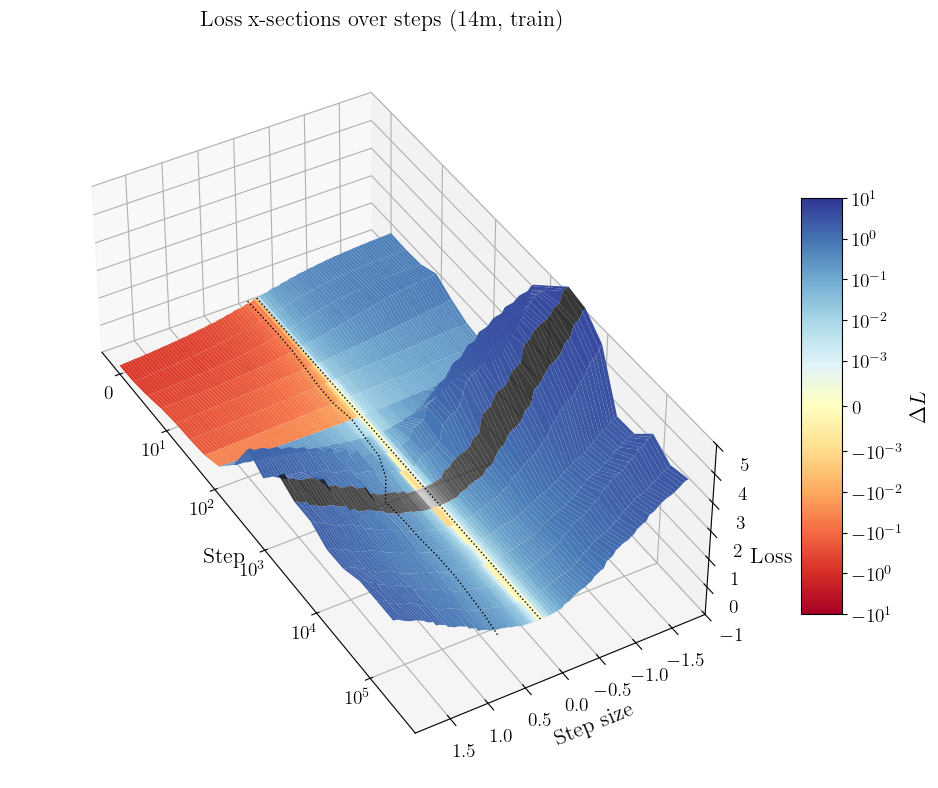

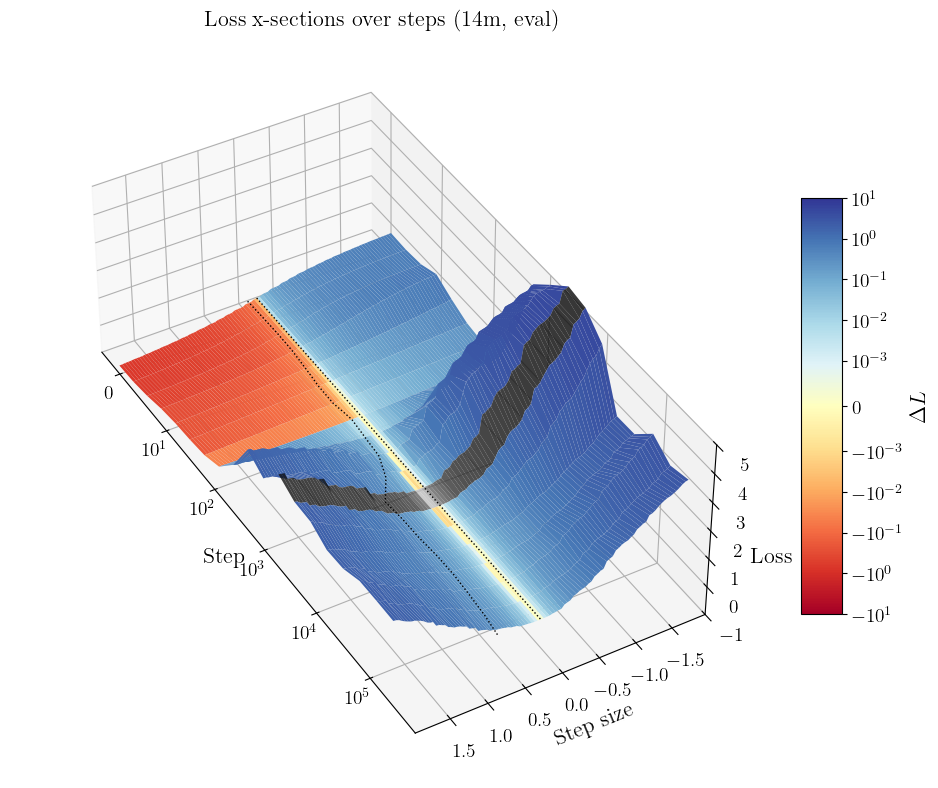

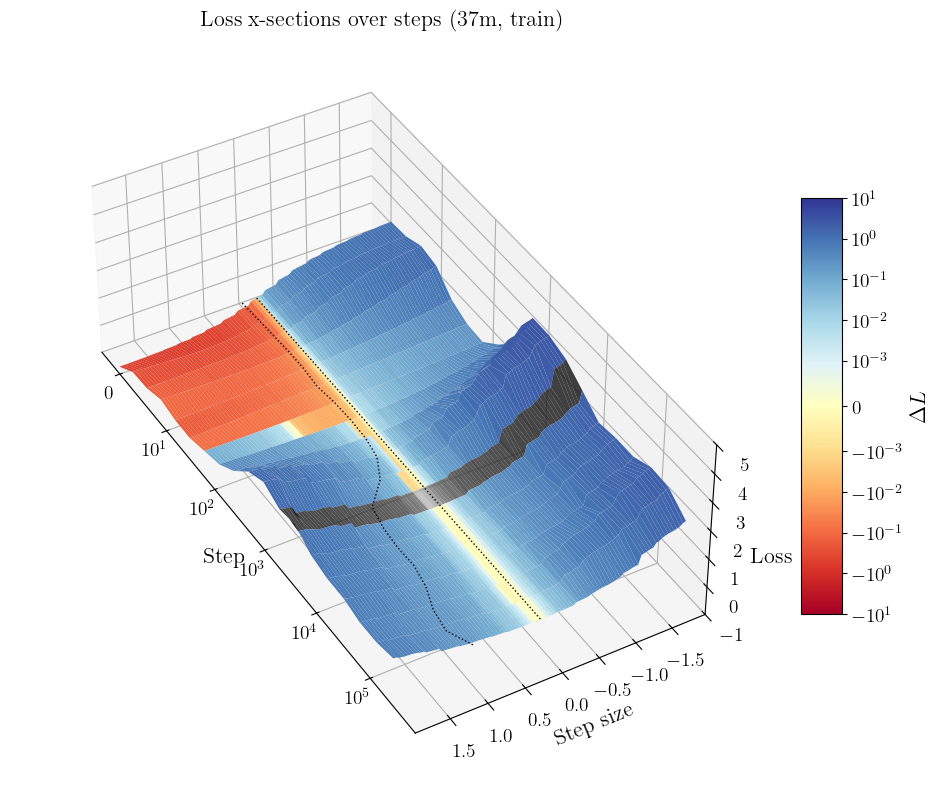

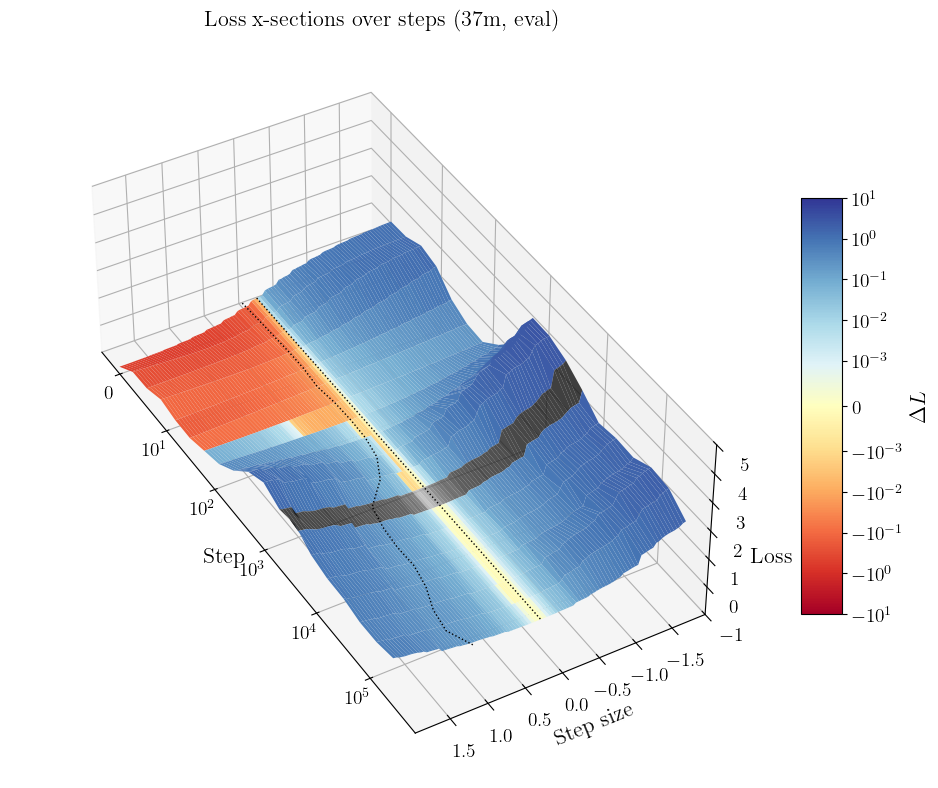

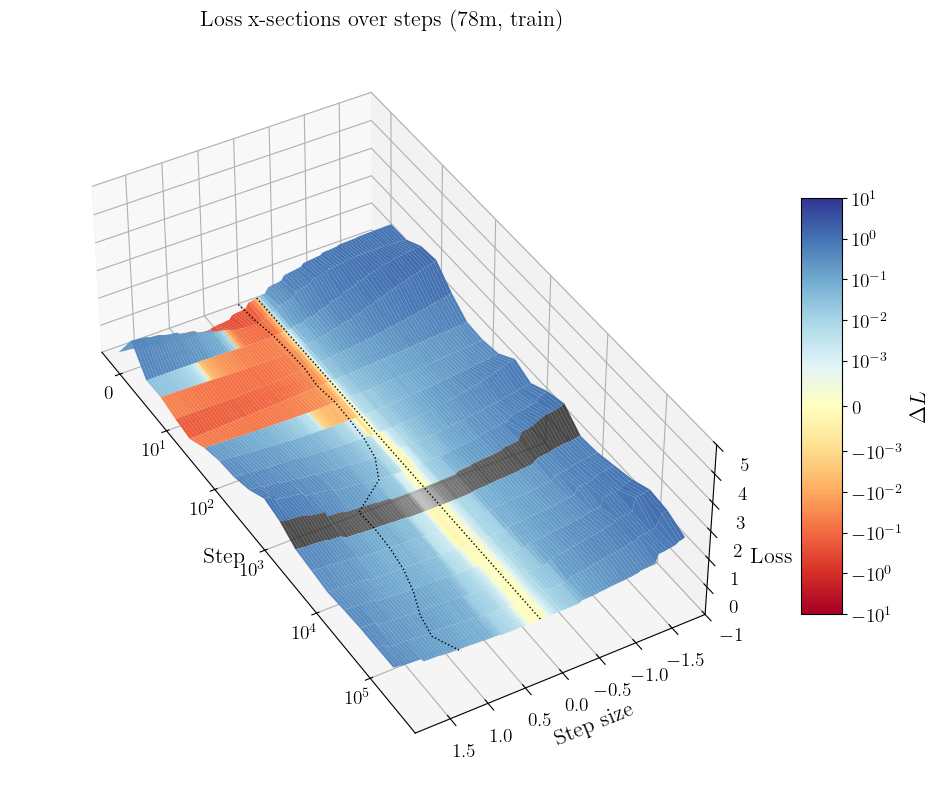

...

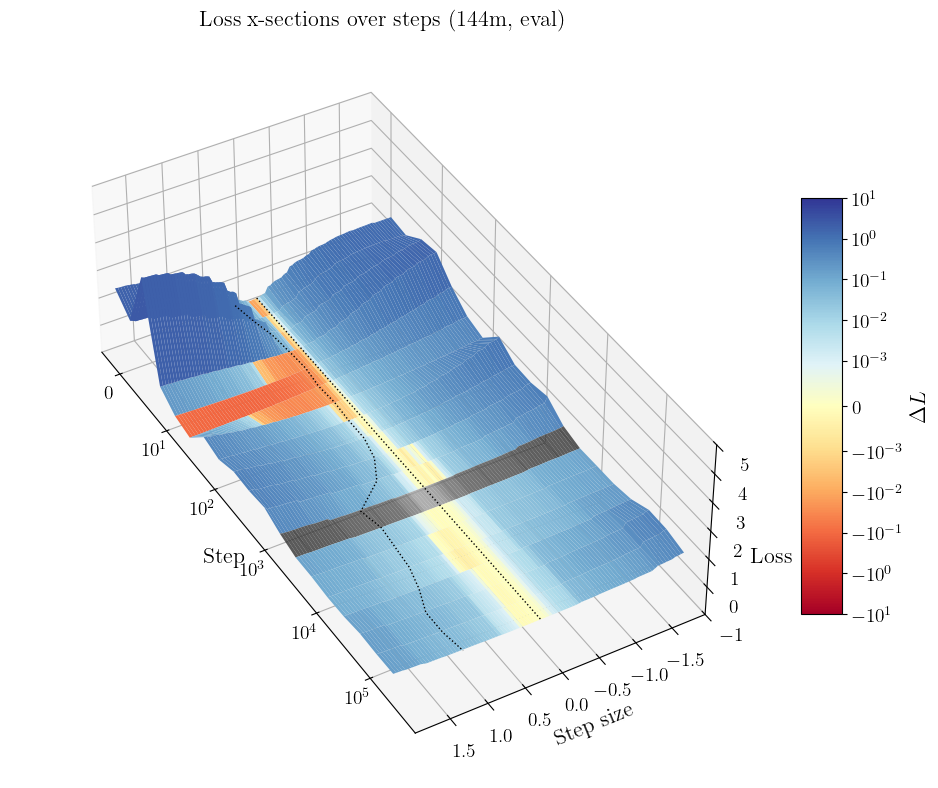

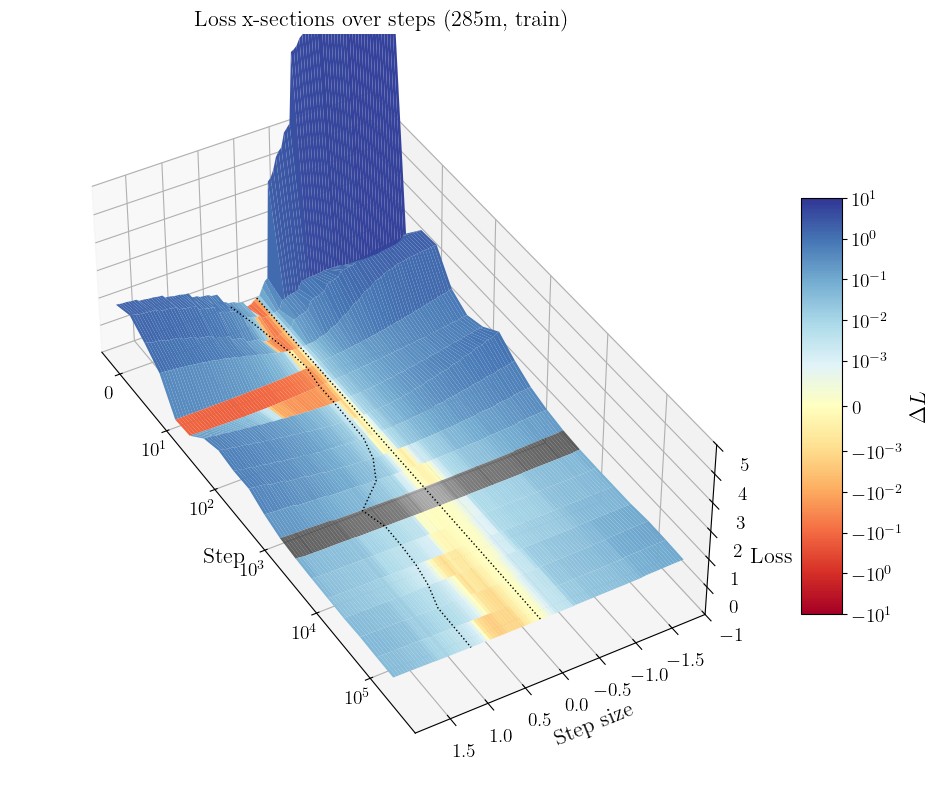

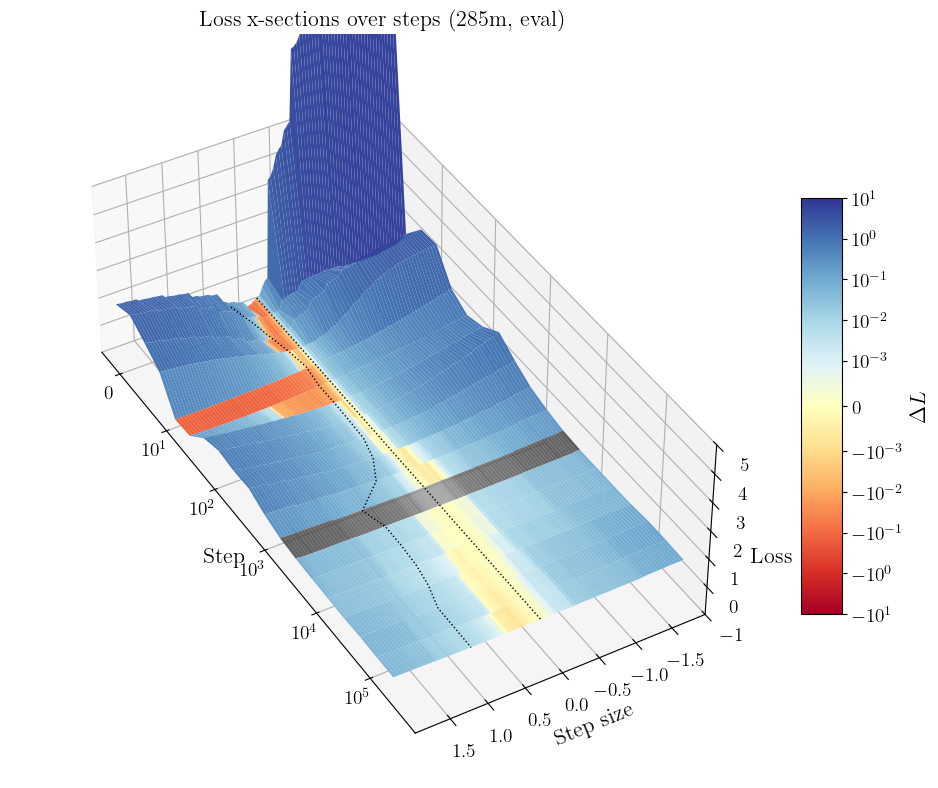

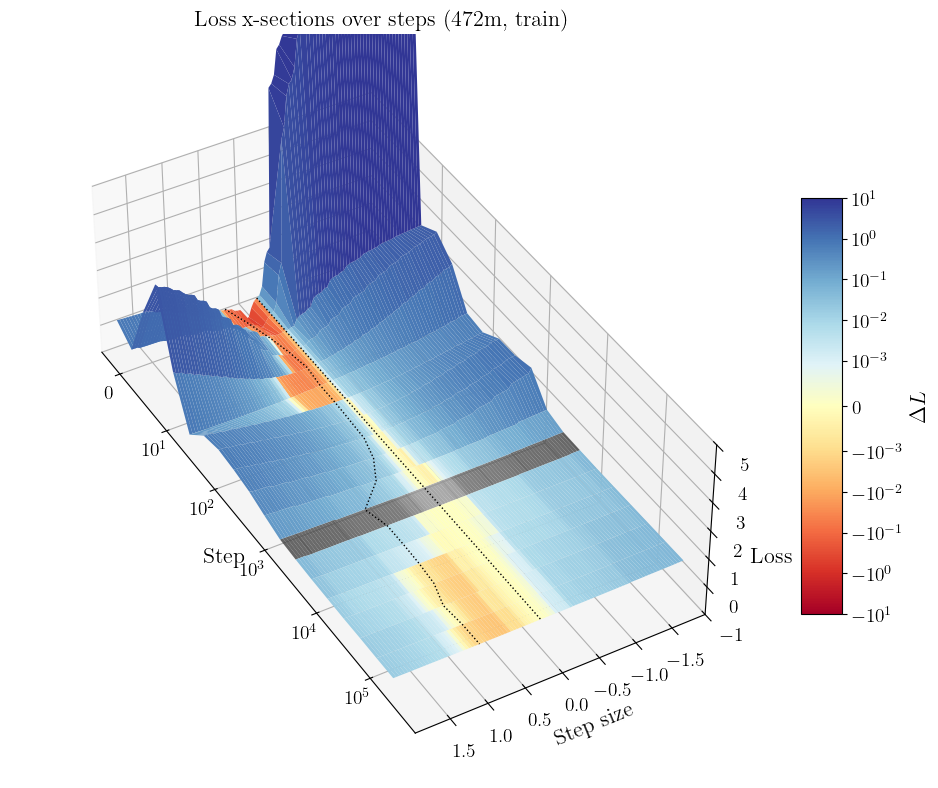

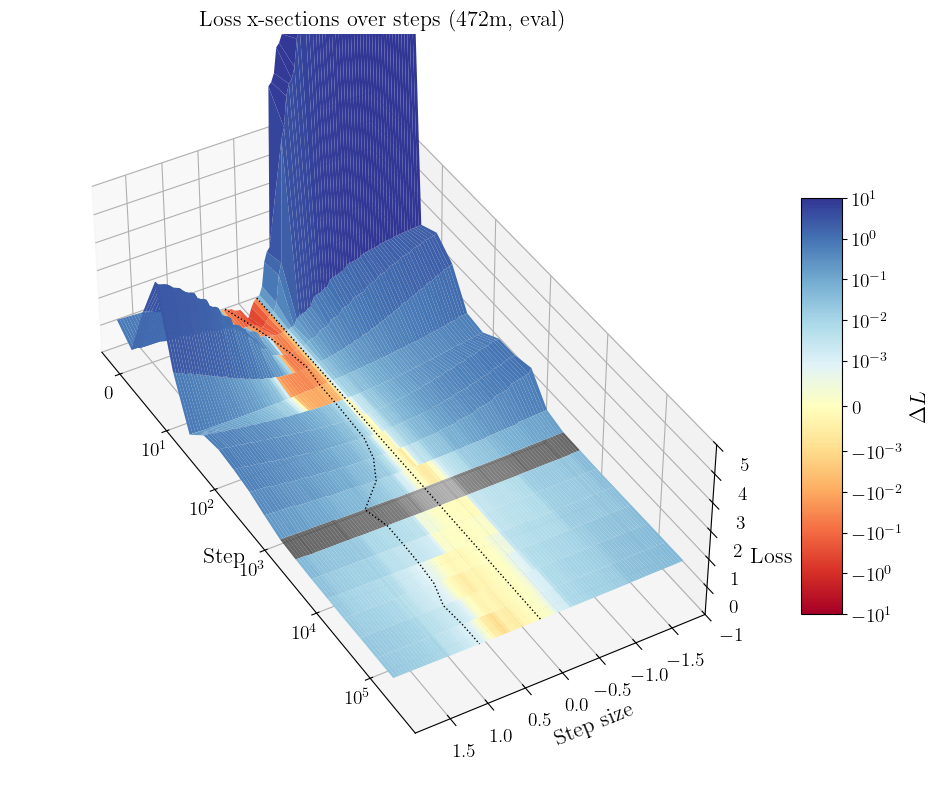

In [4]:
runs_to_plot = RUNS
train_batch_step = 300_000
eval_batch_step = 300_001

cmap = get_cmap('RdYlBu')
linthresh = 1e-3
norm = SymLogNorm(linthresh=linthresh, vmin=-10, vmax=10, base=10)

for i,run in enumerate(runs_to_plot):
    for split in ['train', 'eval']:
        loss_xsections = []
        actual_stepsizes = []
        steps = get_olmo_model_steps(run)
        for step in steps:
            print(f"[run={run}][step={step}][split={split}]", end='\r')
            if split == 'train': metrics = get_metrics_train(run, step, train_batch_step)
            elif split == 'eval': metrics = get_metrics_eval(run, step, train_batch_step, eval_batch_step)
            else: raise Exception
            stepsizes = metrics['stepsizes']
            actual_stepsizes += [metrics['actual_stepsize']]
            loss_xsections += [torch.stack(metrics['losses']).mean(dim=(-1,-2))]

        # stack into array (n_steps, n_stepsizes)
        arr = torch.stack(loss_xsections)  # shape: (len(steps), len(stepsizes))
        zero_idx = stepsizes.index(0)
        arr = arr - arr[:,zero_idx].unsqueeze(1)

        # build coordinate grids
        x = torch.tensor(steps, dtype=torch.float32).log10()
        y = torch.tensor(stepsizes, dtype=torch.float32)
        Xg, Yg = torch.meshgrid(x, y)  # shapes: (len(steps), len(stepsizes))
        
        X = Xg.numpy()
        Y = Yg.numpy()
        Z = arr.numpy()

        # 3D surface plot
        fig = plt.figure(figsize=(12,18))
        ax3 = fig.add_subplot(111, projection='3d')
        ld1 = steps.index(2048)
        ld2 = steps.index(4096)

        surf = ax3.plot_surface(X[:ld1+1], Y[:ld1+1], Z[:ld1+1], cmap=cmap, norm=norm, edgecolor='none', rcount=100, ccount=100)
        ax3.plot_surface(X[ld2:], Y[ld2:], Z[ld2:], cmap=cmap, norm=norm, edgecolor='none', rcount=100, ccount=100)
        ax3.plot_surface(X[ld1:ld2+1], Y[ld1:ld2+1], Z[ld1:ld2+1], cmap='Greys', alpha=0.8,norm=norm, edgecolor='none', rcount=100, ccount=100)

        # zero-line
        x_zl = x
        y_zl = [0 for _ in x]
        z_zl = [0 for _ in x]
        ax3.plot(x_zl, y_zl, z_zl, color='black', linewidth=1, linestyle='dotted', zorder=10)
        ax3.plot(x_zl, actual_stepsizes, z_zl, color='black', linewidth=1, linestyle='dotted', zorder=10)
        

        ax3.set_xlabel('Step')
        ax3.set_ylabel('Step size')
        ax3.set_zlabel('Loss')

        xticks = [i for i in range(6)]
        xticklabels = [0] + [f"$10^{i}$" for i in range(1,6)]
        ax3.set_xticks(xticks, labels=xticklabels)

        ax3.set_ylim(y.max(), y.min())
        ax3.set_zlim(-1, 5)

        ax3.set_box_aspect((3.0, 1.5, 1.0))
        ax3.set_title(f'Loss x-sections over steps ({run.split("-")[-1]}, {split})')
        fig.colorbar(surf, ax=ax3, shrink=0.3, aspect=10, label='$\Delta L$')
        ax3.view_init(elev=40, azim=-30)
        plt.show()
        # break


## Measure sharpness with quadratic fit to loss landscape cross sections

In [8]:
losses.shape

torch.Size([1, 99, 512, 1023])

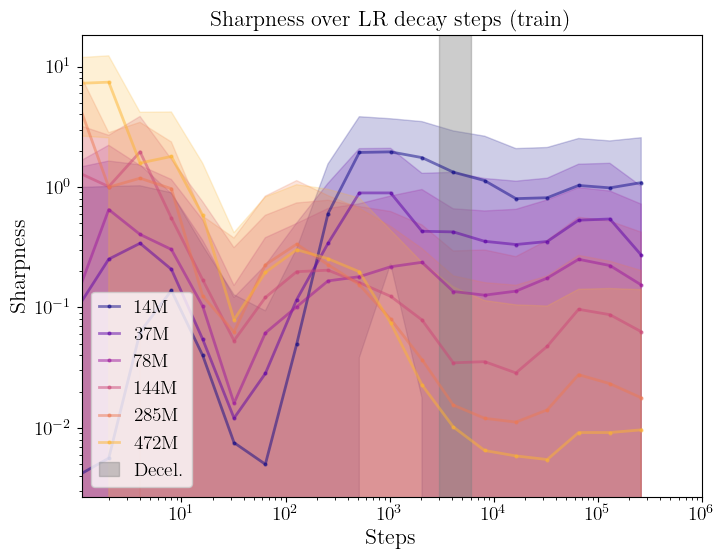

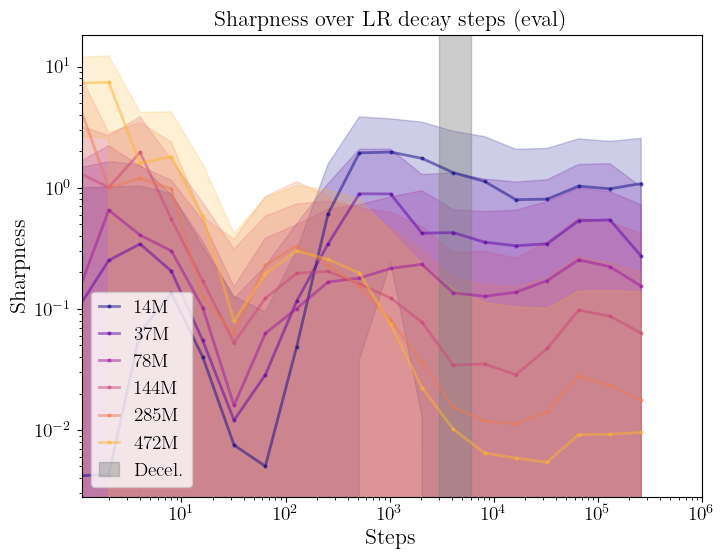

In [9]:
runs_to_plot = RUNS
train_batch_step = 300_000
eval_batch_step = 300_001


for split in ['train', 'eval']:
    fig, ax = plt.subplots(figsize=(8,6))
    for i,run in enumerate(runs_to_plot):
        steps = get_olmo_model_steps(run)
        color = get_color(RUNS.index(run), vmax=len(RUNS))
        model_size = run.split('-')[-1].replace('m', 'M')
        sharpness_vals = []
        sharpness_hi = []
        sharpness_lo = []
        for step in steps:
            print(f"[run={run}][step={step}][split={split}]", end='\r')
            if split == 'train': metrics = get_metrics_train(run, step, train_batch_step)
            elif split == 'eval': metrics = get_metrics_eval(run, step, train_batch_step, eval_batch_step)
            else: raise Exception
            X = np.array(metrics['stepsizes'])
            # Y = torch.stack(metrics['losses']).mean(dim=(-1,-2))
            losses = torch.stack(metrics['losses'])
            idx0 = np.where(X == 0)[0]
            losses = losses - losses[idx0]
            Y = losses.mean(dim=(-1,-2))
            Z = losses.std(dim=(-1,-2))
            idx = np.where((X <= 1) & (X >= -1))[0]
            x = X[idx]
            y = Y[idx]
            z = Z[idx]
            sharpness_vals.append(np.polyfit(x, y, deg=2)[0])
            sharpness_hi.append(np.polyfit(x, y+z, deg=2)[0])
            sharpness_lo.append(np.polyfit(x, y-z, deg=2)[0])


        ax.plot(steps, sharpness_vals, alpha=0.5, color=color, marker='o', linewidth=2, ms=2, label=model_size)
        ax.fill_between(steps, sharpness_lo, sharpness_hi, color=color, alpha=0.2)
        
    ax.axvspan(3000, 6000, color='gray', alpha=0.4, label='Decel.')
    ax.legend(handlelength=1, fontsize=14)
    ax.set_xlabel("Steps")
    ax.set_xscale('log')
    ax.set_xlim(1.1, 1e6)
    ax.xaxis.set_major_locator(mtick.LogLocator(numticks=999))
    ax.xaxis.set_minor_locator(mtick.LogLocator(numticks=999, subs="auto"))

    ax.set_ylabel('Sharpness')
    ax.set_yscale('log', base=10)

    ax.set_title(f'Sharpness over LR decay steps ({split})')
    plt.show()


## Sanity check quadratic fit

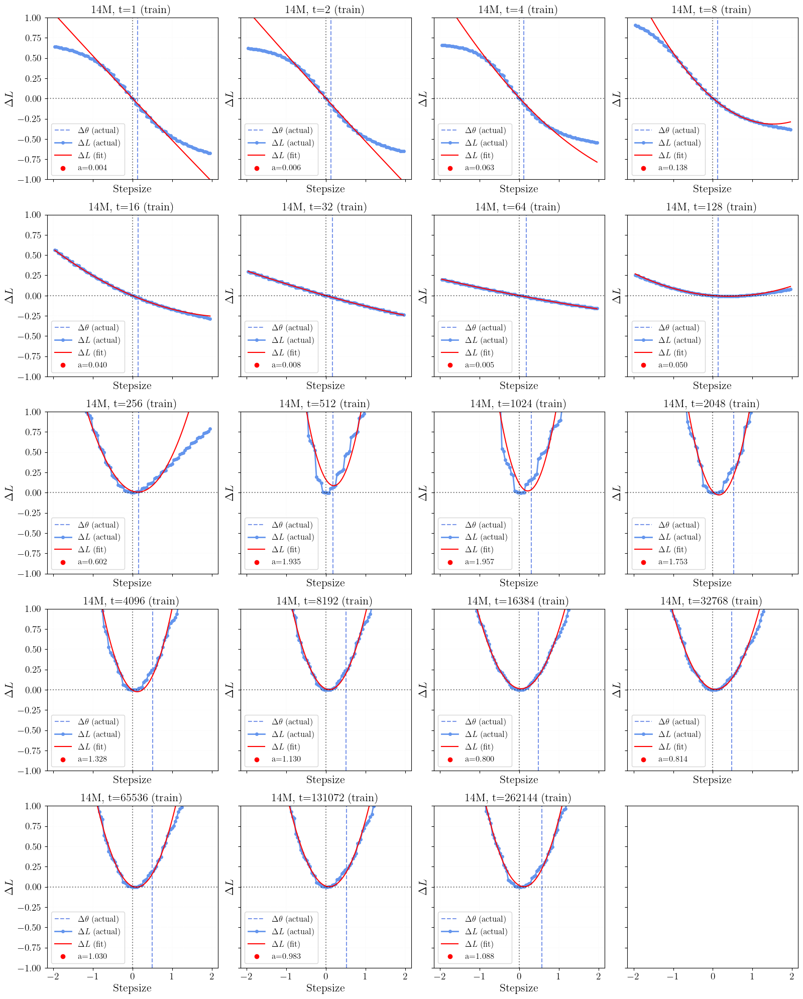

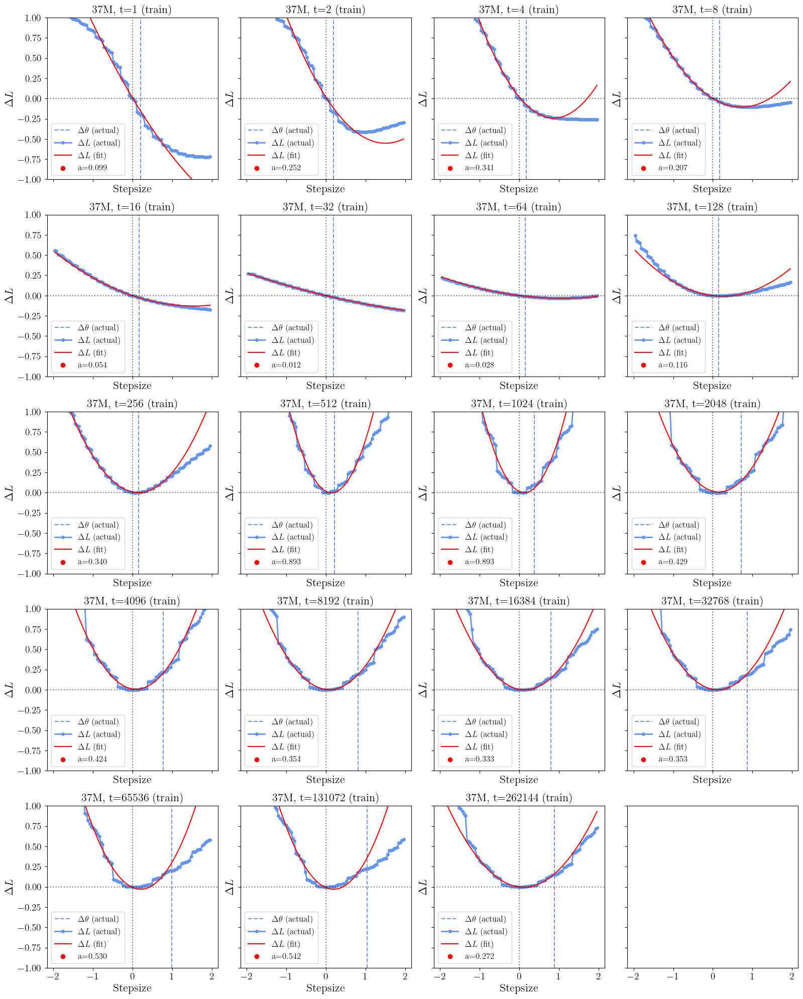

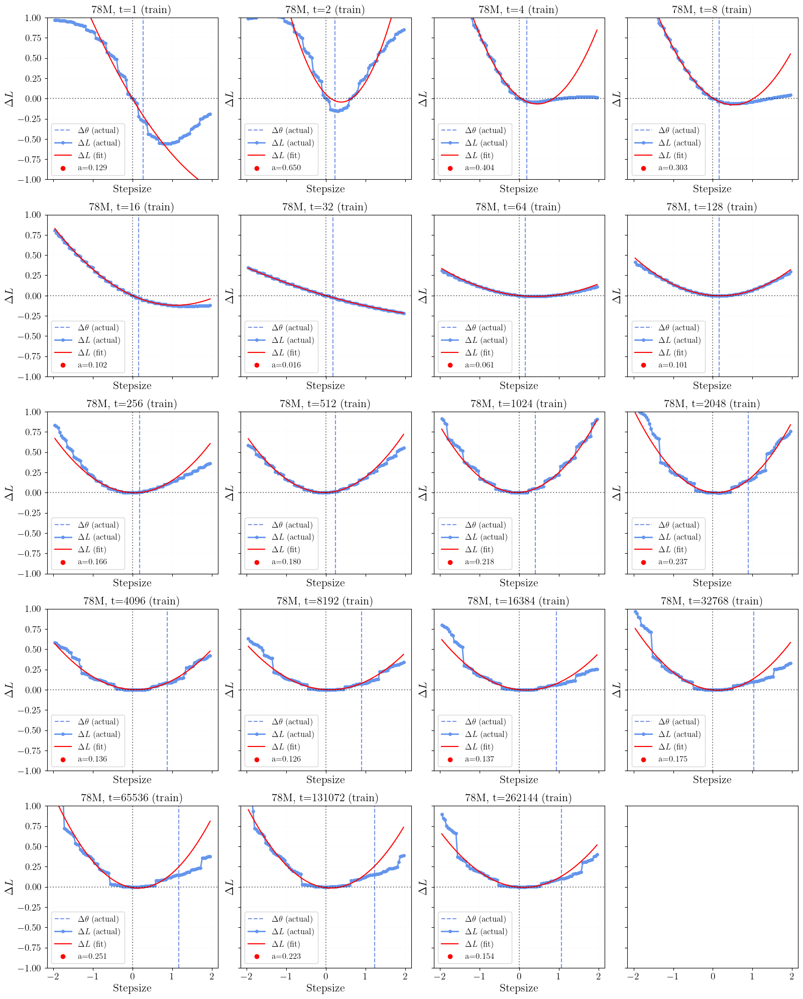

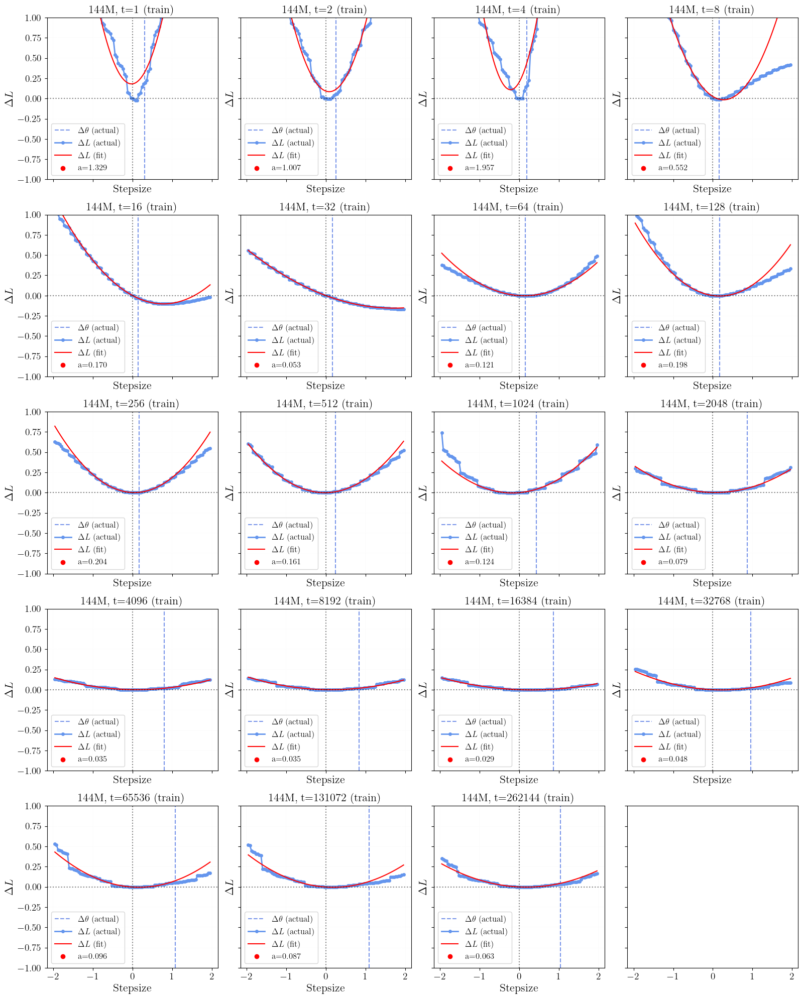

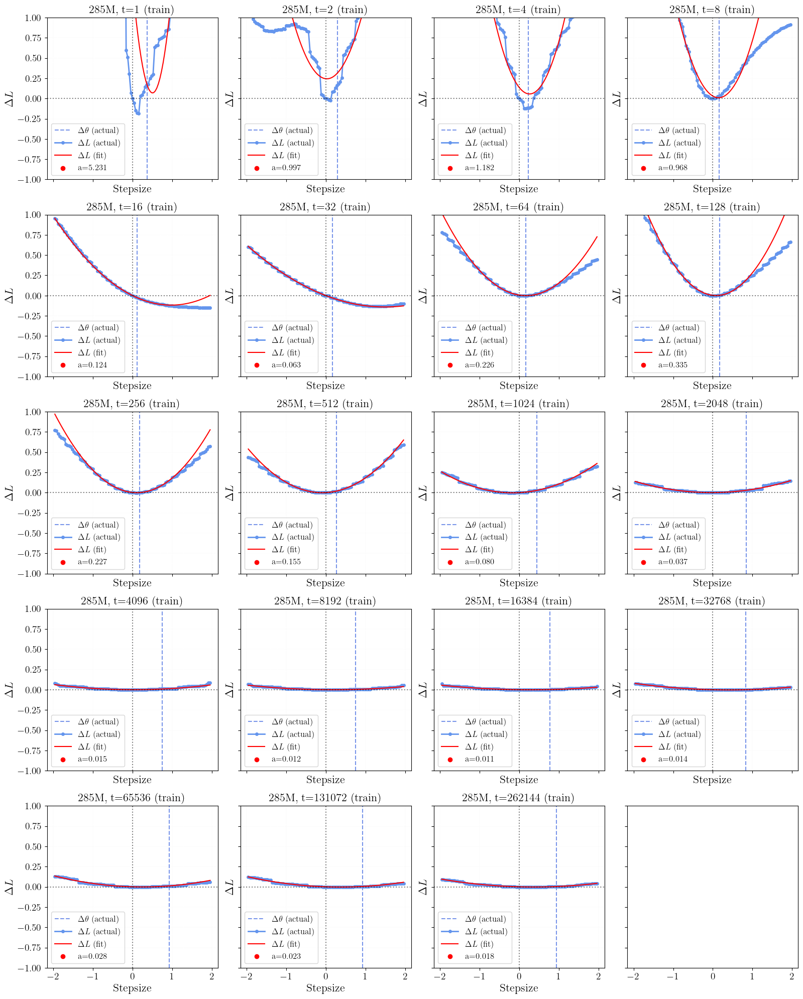

...

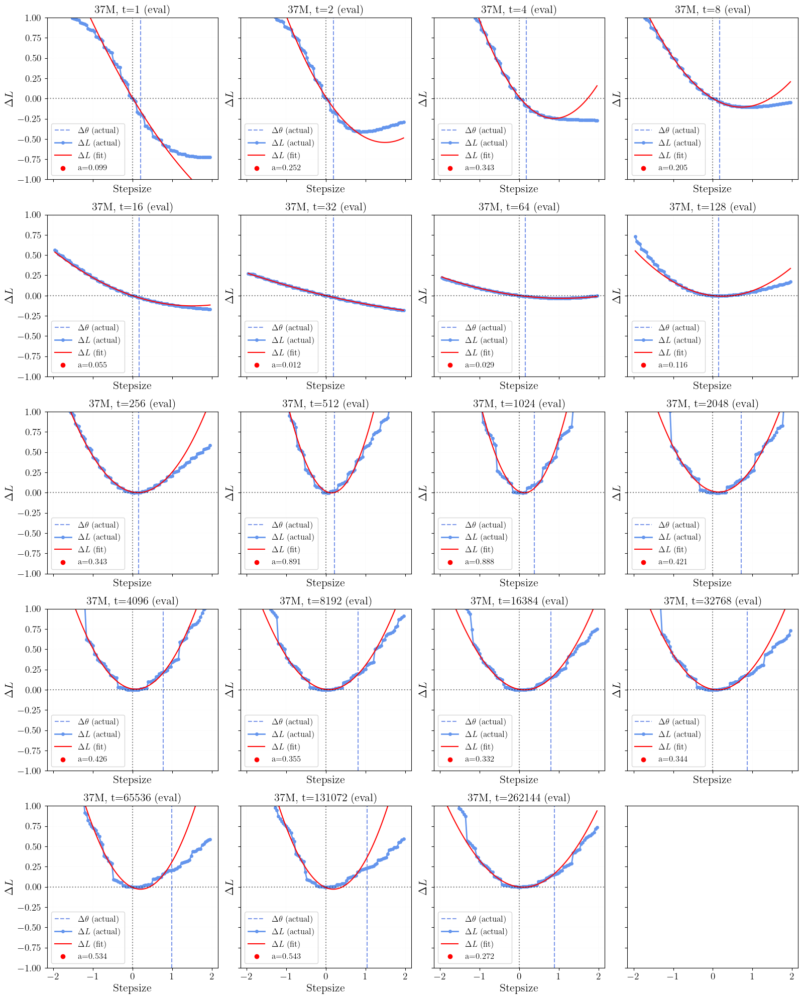

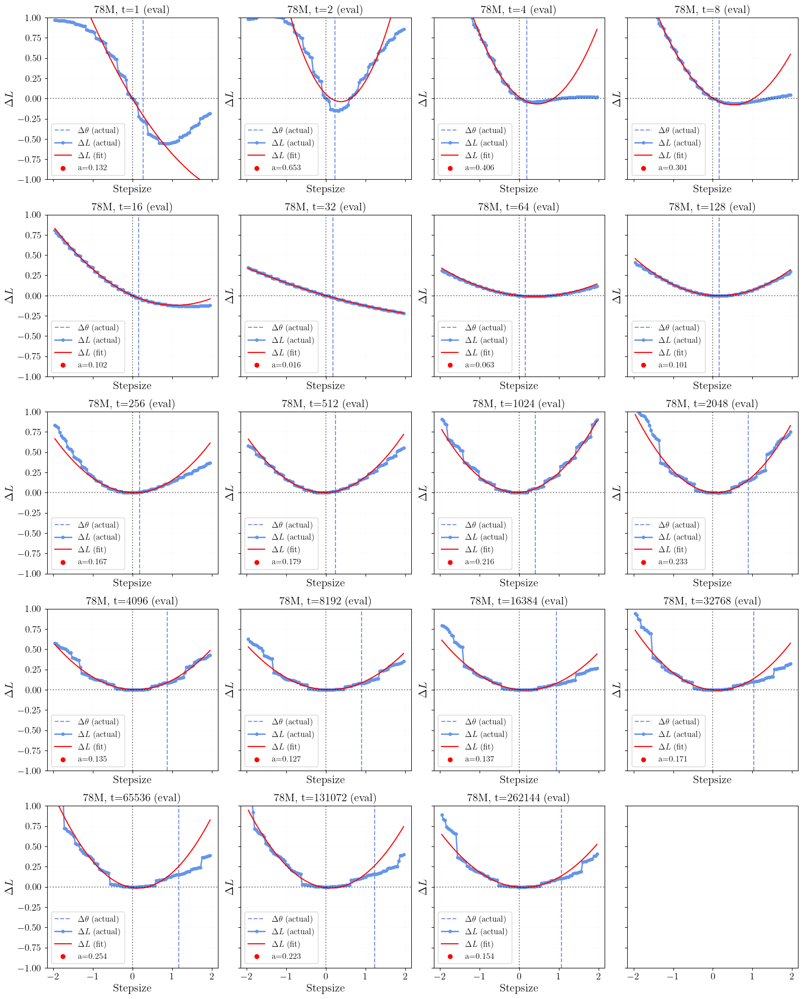

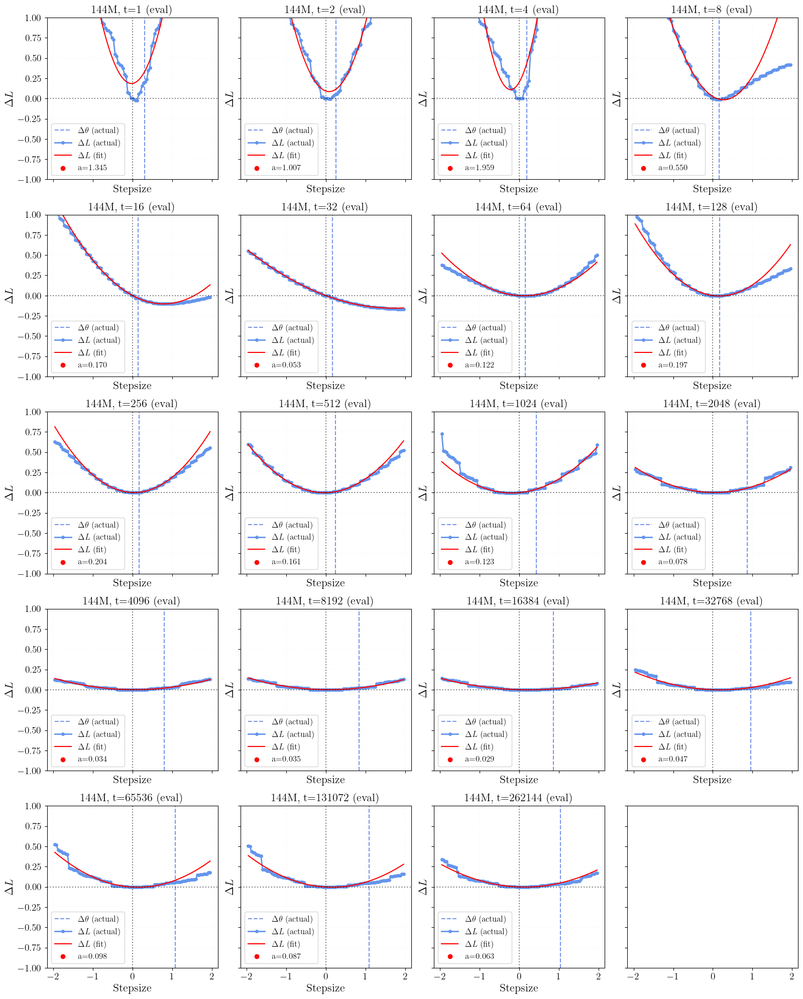

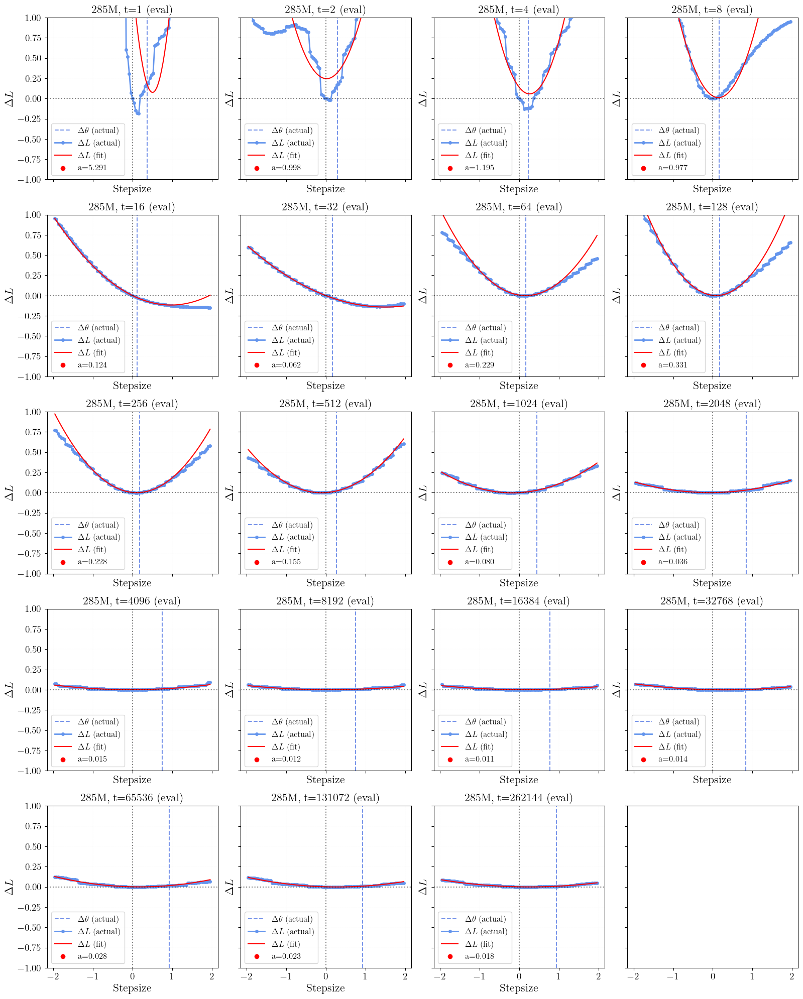

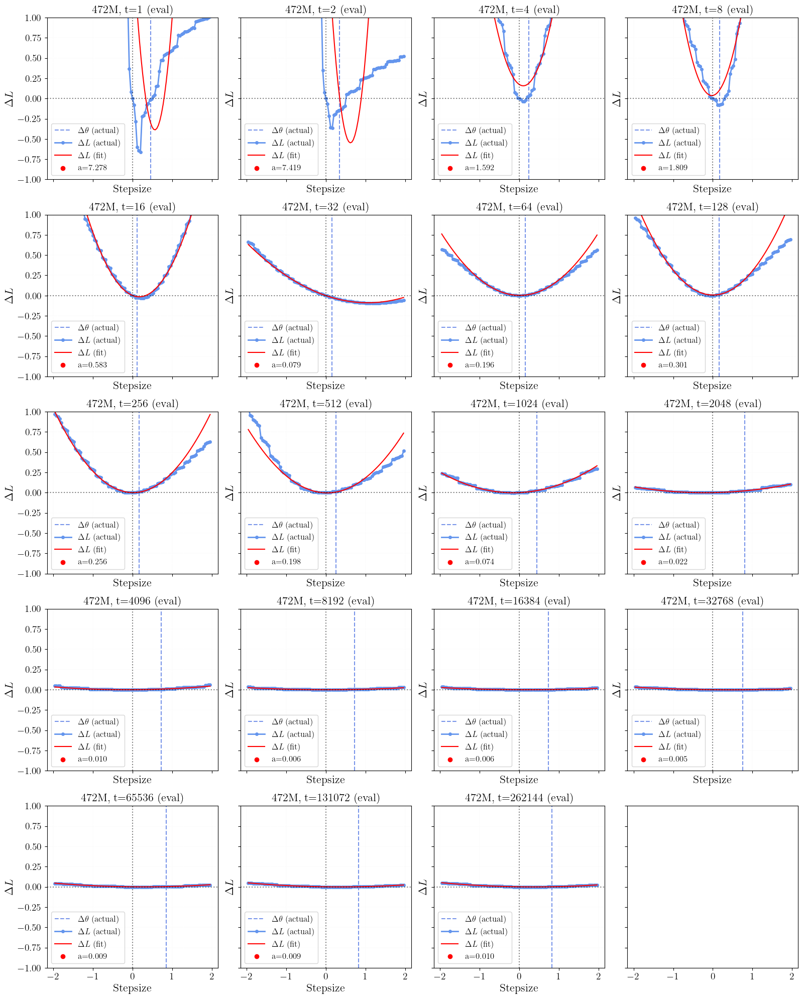

In [39]:
runs_to_plot = RUNS
train_batch_step = 300_000
eval_batch_step = 300_001

for split in ['train', 'eval']:
    for i,run in enumerate(runs_to_plot):
        steps = get_olmo_model_steps(run)
        ncols = 4
        nrows = int(np.ceil(len(steps) / ncols))
        fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True, figsize=(4*ncols, 4*nrows))
        axs = axs.flatten()

        color = get_color(RUNS.index(run), vmax=len(RUNS))
        model_size = run.split('-')[-1].replace('m', 'M')
        for i,step in enumerate(steps):
            ax = axs[i]
            print(f"[run={run}][step={step}][split={split}]", end='\r')
            if split == 'train': metrics = get_metrics_train(run, step, train_batch_step)
            elif split == 'eval': metrics = get_metrics_eval(run, step, train_batch_step, eval_batch_step)
            else: raise Exception
            actual_stepsize = metrics['actual_stepsize']
            X = np.array(metrics['stepsizes'])
            Y = torch.stack(metrics['losses']).mean(dim=(-1,-2))
            idx0 = np.where(X == 0)[0]
            Y = Y - Y[idx0].item()
            idx = np.where((X <= 1) & (X >= -1))[0]
            # idx = np.where((X <= 2) & (X >= -2))[0]
            # idx = np.where((X <= 0.5) & (X >= -0.5))[0]
            x = X[idx]
            y = Y[idx]
            coeffs = np.polyfit(x, y, deg=2)

            ax.set_xlabel("Stepsize")
            ax.set_ylabel("$\Delta L$")
            x_fit = np.linspace(X.min(), X.max(), 100)
            y_fit = coeffs[0]*x_fit**2 + coeffs[1]*x_fit + coeffs[2]
            ax.axvline(actual_stepsize, color='royalblue', linestyle='dashed', alpha=0.7, label='$\Delta \\theta$ (actual)')
            ax.plot(X, Y, color='cornflowerblue',marker='o', linewidth=2, ms=4, label='$\Delta L$ (actual)')
            ax.plot(x_fit, y_fit, color='red', label='$\Delta L$ (fit)')
            ax.scatter([], [], color='red', label=f'a={coeffs[0]:.3f}')

            ax.set_title(f"{model_size}, t={step} ({split})")
            ax.set_ylim(-1,1)
            ax.axvline(0, color='black', linestyle='dotted', alpha=0.5)
            ax.axhline(0, color='black', linestyle='dotted', alpha=0.5)
            ax.grid(linewidth=0.1, alpha=0.4, color='gray', linestyle='dotted', which='both')
            ax.legend(loc='lower left')
            # ax.set_yscale('symlog', linthresh=1e-3)

        plt.tight_layout()
        plt.show()

            # sharpness = coeffs[0].item()  # Second-order term
            # sharpness_values.append(sharpness)


    #     ax.plot(steps, sharpness_values, alpha=0.5, color=color, marker='o', linewidth=2, ms=2, label=model_size)

    # ax.axvspan(3000, 6000, color='gray', alpha=0.4, label='Decel.')
    # ax.legend(handlelength=1, fontsize=14, loc='upper right')
    # ax.set_xlabel("Steps")
    # ax.set_xscale('log')
    # ax.set_xlim(1.1, 1e6)
    # ax.xaxis.set_major_locator(mtick.LogLocator(numticks=999))
    # ax.xaxis.set_minor_locator(mtick.LogLocator(numticks=999, subs="auto"))

    # ax.set_ylabel('Sharpness')
    # ax.set_yscale('log', base=2)

    # ax.set_title(f'Sharpness over LR decay steps ({split})')
    # plt.show()


In [52]:
[1,2,3][:1]

[1]

In [26]:
metrics_eval

{'losses': [tensor([[10.8125,  9.6250, 10.5000,  ..., 10.9375, 10.0625, 11.1875],
          [ 8.3750,  7.8438,  7.6562,  ...,  6.8750, 11.0625, 11.0000],
          [ 4.0312, 12.9375, 10.5625,  ..., 11.4375, 10.8125,  7.7500],
          ...,
          [ 7.0625,  4.5000,  8.8125,  ...,  9.9375, 11.0000,  8.0625],
          [ 9.0625, 11.5625, 10.2500,  ..., 13.5000, 10.2500, 11.2500],
          [ 1.7109,  9.0000,  7.0938,  ..., 13.1250,  2.3750, 11.0000]]),
  tensor([[10.8125,  9.6250, 10.5000,  ..., 10.9375, 10.0000, 11.1875],
          [ 8.3750,  7.8125,  7.5938,  ...,  6.8125, 11.0000, 10.9375],
          [ 4.0000, 12.9375, 10.5000,  ..., 11.4375, 10.8125,  7.7500],
          ...,
          [ 7.0625,  4.4688,  8.7500,  ...,  9.9375, 11.0000,  8.0625],
          [ 9.0625, 11.5625, 10.2500,  ..., 13.4375, 10.1875, 11.2500],
          [ 1.7109,  9.0000,  7.0625,  ..., 13.1250,  2.3750, 11.0000]]),
  tensor([[10.7500,  9.5625, 10.4375,  ..., 10.9375,  9.9375, 11.1250],
          [ 8.2500, 

/tmp/ipykernel_773066/2751248291.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('RdYlBu')


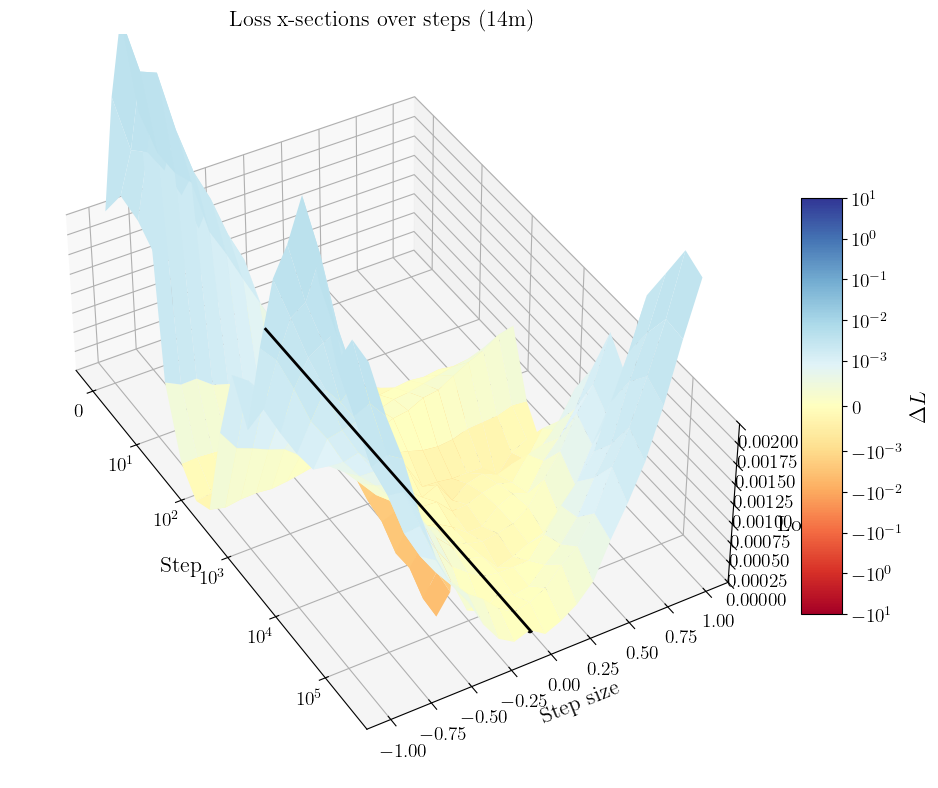

In [71]:
import numpy as np

cmap = get_cmap('RdYlBu')
linthresh = 1e-3
norm = SymLogNorm(linthresh=linthresh, vmin=-10, vmax=10, base=10)



arr = torch.stack(loss_xsections)
zero_idx = stepsizes.index(0)
arr = arr - arr[:,zero_idx].unsqueeze(1)

x = torch.tensor(steps, dtype=torch.float32).log10()
y = torch.tensor(stepsizes, dtype=torch.float32)
y = y[10:-10]
arr = arr[:, 10:-10]
idx_actual_stepsizes = [np.argmin(np.abs(np.array(y) - s)) for s in actual_stepsizes]

Xg, Yg = torch.meshgrid(x, y)  # shapes: (len(steps), len(stepsizes))
X = Xg.numpy()
Y = Yg.numpy()
Z = arr.numpy() 


# 3D surface plot
fig = plt.figure(figsize=(12,18))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_box_aspect((3.0, 2.0, 1.0)) 
surf = ax3.plot_surface(X, Y, Z, cmap=cmap, norm=norm, edgecolor='none', rcount=100, ccount=100)

n_steps = Z.shape[0]
rows = np.arange(n_steps)
xs = X[rows, idx_actual_stepsizes]                         # x coordinate for each min
ys = Y[rows, idx_actual_stepsizes]                         # y coordinate for each min
zs = Z[rows, idx_actual_stepsizes]     
ax3.plot(xs, ys, zs, color='k', linewidth=2, zorder=10)
ax3.scatter(xs, ys, zs, color='k', s=12, zorder=11)


ax3.set_xlabel('Step')
xticks = [i for i in range(6)]
xticklabels = [0] + [f"$10^{i}$" for i in range(1,6)]
ax3.set_xticks(xticks, labels=xticklabels)

ax3.set_ylabel('Step size')

ax3.set_zlabel('Loss')
ax3.set_zlim(0, 0.002)
ax3.set_title(f'Loss x-sections over steps ({run.split("-")[-1]})')
fig.colorbar(surf, ax=ax3, shrink=0.3, aspect=10, label='$\Delta L$')
ax3.view_init(elev=40, azim=-30)
plt.show()

In [73]:
2**18

262144

In [62]:
grad_metrics = torch.load(ZSL_DIR_ANALYSIS / 'grad_intrf_token/olmo-c4_en_val/1028-rmsnorm-144m/train-batch=262144/train/grad/step2.pt', map_location="cpu")

/tmp/ipykernel_773066/1384577500.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  grad_metrics = torch.load(ZSL_DIR_ANALYSIS / 'grad_intrf_token/olmo-c4_en_val/1028-rmsno

In [29]:
grad_metrics['model'].keys()

dict_keys(['C_i_gij_hist', 'Σj_Σi_gij', 'Σj_Σi_abs_gij', 'C_j_pij', 'Σj_pij', 'Σj_abs_pij', 'C_j_qj', 'Σj_qj', 'Σj_abs_qj', 'Cg', 'Σj_abs_Σi_pij', 'Σj_Σi_abs_pij', 'Cug', 'Σi_abs_Σj_pij', 'CuG', 'Σj_Σi_pij', 'C_i_dli', 'M_i_dli', 'norm_l2sq_delta', 'norm_l2sq_G', 'norm_l2sq_gi', 'norm_l1_delta', 'norm_l1_G', 'norm_l1_gi'])

/tmp/ipykernel_1366898/219583473.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('plasma')


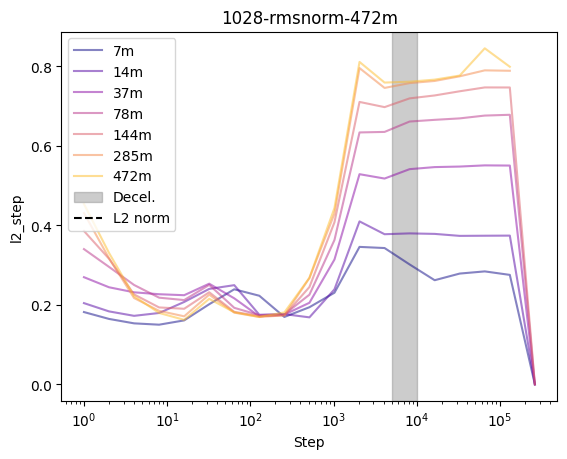

In [ ]:
# visualize distance with final model


cmap = get_cmap('plasma')
norm = Normalize(vmin=0, vmax=len(RUNS))

fig, ax = plt.subplots()

k = 'l2_step'
for i,run in enumerate(RUNS[:2]):
    out_dir = EVAL_DIR / run / "dist_to_final"
    steps = get_model_steps(run)
    run_data = defaultdict(list)
    for step in steps:
        out_path = out_dir / f"step{step}.pt"
        metrics = torch.load(out_path)
        run_data[k]  += [torch.tensor([v for v in metrics[k].values()]).norm().item()]

    color = cmap(norm(i))
    label = run.split('-')[-1]
    ax.plot(steps, run_data[k], color=color, alpha=0.5, label=label)
ax.set_title(run)
ax.set_xlabel('Step')
ax.set_ylabel(k)
ax.set_xscale('log')
# ax.set_yscale('log')
ax.axvspan(5e3, 1e4, color='gray', alpha=0.4, label='Decel.')
ax.plot([],[], color='black', linestyle='dashed', label='L2 norm')
ax.legend()
plt.show()

    

With learning rates between `1e-3` and `1e-4` let's consider what can happen over `1e5` optimization steps.
If the trajectory were a straight line, then the L2 from the final model would change 

In [84]:
print(len(STEP_SIZES))
for s in STEP_SIZES:
    print(s)

73
-9.0
-8.0
-7.0
-6.0
-5.0
-4.0
-3.0
-2.0
-1.0
-0.9
-0.8
-0.7
-0.6
-0.5
-0.4
-0.3
-0.2
-0.1
-0.09
-0.08
-0.07
-0.06
-0.05
-0.04
-0.03
-0.02
-0.01
-0.009
-0.008
-0.007
-0.006
-0.005
-0.004
-0.003
-0.002
-0.001
0
0.001
0.002
0.003
0.004
0.005
0.006
0.007
0.008
0.009
0.01
0.02
0.03
0.04
0.05
0.06
0.07
0.08
0.09
0.1
0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0


# Sanity check einsum

In [47]:
B = 4
S = 1023
d = 10
p = 12

x = torch.rand(B, S, d) - 0.5
W = torch.rand(p,d) - 0.5
y = torch.nn.functional.linear(x, W)

dLdy = torch.rand_like(y) - 0.5
dW = torch.rand_like(W) - 0.5
psg_dotp = torch.einsum('B...p,pd,B...d->B...', dLdy, dW, x)

dotp_1 = []
dotp_2 = []
for i in range(B):
    for j in range(S):
        dotp_1.append(psg_dotp[i][j].item())
        dLdW = dLdy[i][j].unsqueeze(-1) @ x[i][j].unsqueeze(0)
        dotp_2.append(dLdW.flatten().dot(dW.flatten()).item())


# plot
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
ax.scatter(dotp_1, dotp_2, s=1)

NameError: name 'GA_PTG_DOTP_M' is not defined